<a href="https://colab.research.google.com/github/OulaSu/derma_trio/blob/main/derma_trio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# pip install fastbook

In [2]:
from fastai.vision.all import *
from ipywidgets import widgets
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *
import os

In [3]:
# pip install azure-cognitiveservices-search-imagesearch

Get Azure Key to load the image bing search and define a search_images_bing function

In [4]:
key = os.environ.get('AZURE_SEARCH_KEY', 'f3cba16c65e94f22821a110bf59b70ce')

from azure.cognitiveservices.search.imagesearch import ImageSearchClient as api
from msrest.authentication import CognitiveServicesCredentials as auth

def search_images_bing(key, term, min_sz=128, max_images=150):
     params = {'q':term, 'count':max_images, 'min_height':min_sz, 'min_width':min_sz}
     headers = {"Ocp-Apim-Subscription-Key":key}
     search_url = "https://api.bing.microsoft.com/v7.0/images/search"
     response = requests.get(search_url, headers=headers, params=params)
     response.raise_for_status()
     search_results = response.json()
     return L(search_results['value'])

In [5]:
search_images_bing

<function __main__.search_images_bing(key, term, min_sz=128, max_images=150)>

Create a search query with the required terms and search for one result

In [6]:
results = search_images_bing(key, 'eczema')
ims = results.attrgot('contentUrl')

# Check
print(len(ims))
print(ims[0])

150
https://www.thehealthy.com/wp-content/uploads/2017/08/shutterstock_522715072.jpg


use fastai's download_images to download all the URLs for each of our search terms. We'll put each in a separate folder:

In [7]:
derma_conditions = 'eczema','urticaria','rosacea'
path = Path('derma')


if not path.exists():
    path.mkdir()
    for o in derma_conditions:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [8]:
fns = get_image_files(path)
fns

(#384) [Path('derma/rosacea/e39f3dfe-8d8a-4ffe-9386-0dcdbb41db8b.png'),Path('derma/rosacea/690a569e-d1ac-44a4-9ec3-742f47f18ef5.jpg'),Path('derma/rosacea/667bf4fc-c45f-42c2-ba67-11ef9720fb2a.jpg'),Path('derma/rosacea/60614bd5-9bb5-4392-bb88-1cc38acc3656.jpg'),Path('derma/rosacea/23c147bd-5395-4ac7-a1e1-edffd6d2b1a0.jpg'),Path('derma/rosacea/e209fa0d-ef86-4e09-b351-df1f60982a62.jpg'),Path('derma/rosacea/2714e5dc-2ac1-416a-8d30-a125122a4a50.jpg'),Path('derma/rosacea/f3c7ff9c-1aaa-414d-a95e-1b928fee8b50.jpg'),Path('derma/rosacea/9e463bd6-fdf1-4bd0-a45e-41353447ea91.jpg'),Path('derma/rosacea/1e6a2a84-63b7-4ebd-b130-751bc247b888.jpg')...]

Often when we download files from the internet, there are a few that are corrupt. Let's check:

In [9]:
failed = verify_images(fns)
failed

(#0) []

In [10]:
failed.map(Path.unlink);

fastai has an extremely flexible system called the data block API. With this API you can fully customize every stage of the creation of your DataLoaders. Here is what we need to create a DataLoaders for the dataset that we just downloaded:

In [11]:
conditions = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

A DataLoaders includes validation and training DataLoaders. DataLoader is a class that provides batches of a few items at a time to the GPU. This command has given us a DataBlock object. This is like a template for creating a DataLoaders. We still need to tell fastai the actual source of our data—in this case, the path where the images can be found:

In [12]:
dls = conditions.dataloaders(path)

We can take a look at a few of those items by calling the show_batch method on a DataLoader:

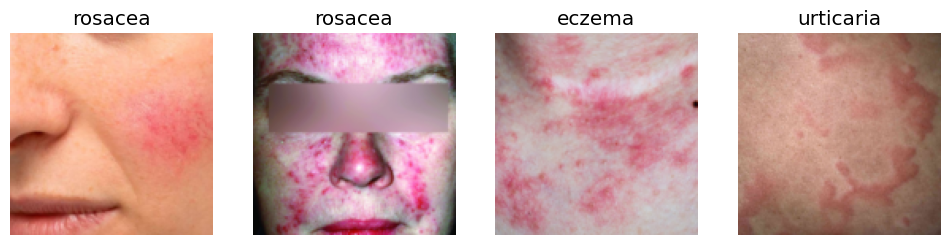

In [13]:
dls.valid.show_batch(max_n=4, nrows=1)

Data Augmentation: We don't have a lot of data for our problem (150 pictures of each sort of bear at most), so to train our model, we'll use RandomResizedCrop with an image size of 224 px, which is fairly standard for image classification, and default aug_transforms:

In [14]:
conditions = conditions.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = conditions.dataloaders(path)

We can now create our Learner and fine-tune it in the usual way:

In [15]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.985340,1.740969,0.605263,00:19


epoch,train_loss,valid_loss,error_rate,time
0,1.224401,1.194045,0.434211,00:13
1,1.120294,0.991165,0.328947,00:11
2,0.974917,0.954768,0.342105,00:13
3,0.886829,0.915191,0.315789,00:13


To visualize this, we can create a confusion matrix:

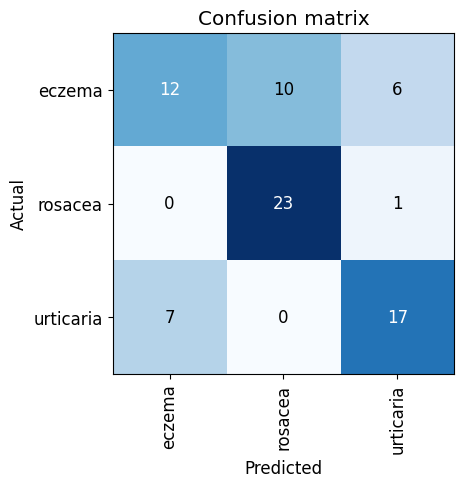

In [16]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

t's helpful to see where exactly our errors are occurring, to see whether they're due to a dataset problem, or a model problem. To do this, we can sort our images by their ***loss***. The loss is a number that is higher if the model is incorrect (especially if it's also confident of its incorrect answer), or if it's correct, but not confident of its correct answer.

`plot_top_losses` shows us the images with the highest loss in our dataset


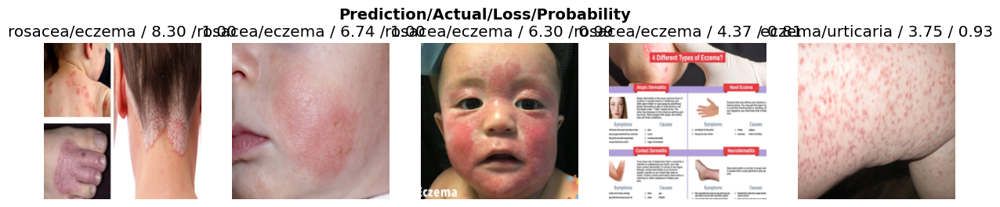

In [17]:
interp.plot_top_losses(5, nrows=1)

fastai includes a handy GUI for data cleaning called ImageClassifierCleaner that allows you to choose a category and the training versus validation set and view the highest-loss images (in order)

In [20]:
cleaner = ImageClassifierCleaner(learn)
cleaner

 ImageClassifierCleaner doesn't actually do the deleting or changing of labels for you; it just returns the indices of items to change. So, for instance, to delete (unlink) all images selected for deletion, we would run: #1

To move images for which we've selected a different category, we would run: #2

In [21]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Now we can retrain the model with cleaner data

In [22]:
conditions = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

dls = conditions.dataloaders(path)

In [23]:
conditions = conditions.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = conditions.dataloaders(path)

In [24]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.662454,2.380098,0.644737,00:13


epoch,train_loss,valid_loss,error_rate,time
0,1.129173,1.157908,0.460526,00:12
1,1.020565,0.970687,0.289474,00:12
2,0.860932,0.937522,0.236842,00:14
3,0.779227,0.940245,0.263158,00:13


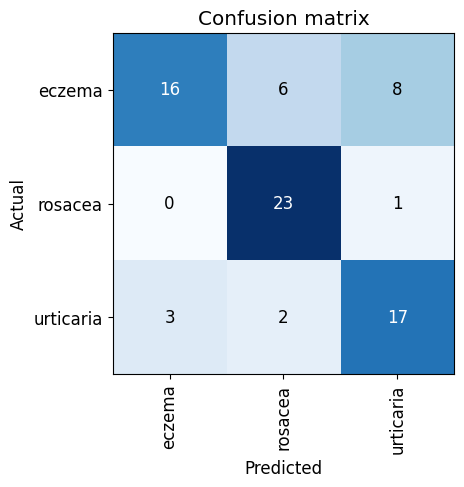

In [25]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [26]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [27]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [28]:
fns = get_image_files(path)
fns

(#381) [Path('derma/rosacea/e39f3dfe-8d8a-4ffe-9386-0dcdbb41db8b.png'),Path('derma/rosacea/690a569e-d1ac-44a4-9ec3-742f47f18ef5.jpg'),Path('derma/rosacea/667bf4fc-c45f-42c2-ba67-11ef9720fb2a.jpg'),Path('derma/rosacea/60614bd5-9bb5-4392-bb88-1cc38acc3656.jpg'),Path('derma/rosacea/23c147bd-5395-4ac7-a1e1-edffd6d2b1a0.jpg'),Path('derma/rosacea/e209fa0d-ef86-4e09-b351-df1f60982a62.jpg'),Path('derma/rosacea/2714e5dc-2ac1-416a-8d30-a125122a4a50.jpg'),Path('derma/rosacea/f3c7ff9c-1aaa-414d-a95e-1b928fee8b50.jpg'),Path('derma/rosacea/9e463bd6-fdf1-4bd0-a45e-41353447ea91.jpg'),Path('derma/rosacea/1e6a2a84-63b7-4ebd-b130-751bc247b888.jpg')...]

Third and last run

In [29]:
conditions = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

dls = conditions.dataloaders(path)

In [30]:
conditions = conditions.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = conditions.dataloaders(path)

In [31]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.001513,3.174304,0.710526,00:13


epoch,train_loss,valid_loss,error_rate,time
0,1.150173,1.314011,0.500000,00:13
1,0.977103,0.793821,0.289474,00:12
2,0.870813,0.647674,0.223684,00:14
3,0.790636,0.598606,0.223684,00:13


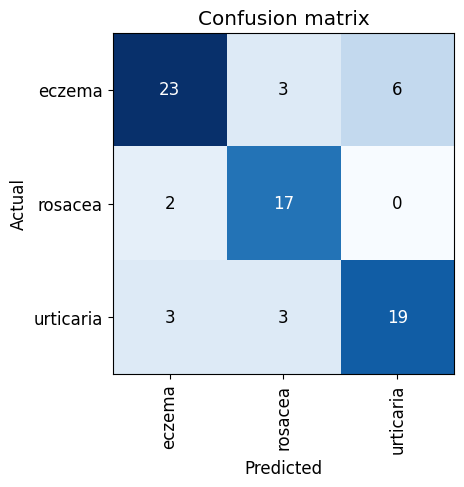

In [32]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

a model consists of two parts: the architecture and the trained parameters. The easiest way to save the model is to save both of these, because that way when you load a model you can be sure that you have the matching architecture and parameters. To save both parts, use the export method.This method even saves the definition of how to create your DataLoaders.

In [40]:
learn.export()

Let's check that the file exists, by using the ls method that fastai adds to Python's Path class:

In [41]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

When we use a model for getting predictions, instead of training, we call it inference. To create our inference learner from the exported file, we use load_learner

In [35]:
learn_inf = load_learner(path/'export.pkl')

IPython widgets are GUI components that bring together JavaScript and Python functionality in a web browser. We'll make an upload button

In [36]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [37]:
img = PILImage.create(btn_upload.data[-1])
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

Then we can get our predictions: and use a Label to display them:

In [38]:
pred,pred_idx,probs = learn_inf.predict(img)

In [39]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: eczema; Probability: 0.6006')